# Plotting

Sage can produce two-dimensional and three-dimensional plots.

## Two-dimensional plots

In two dimensions, Sage can draw circles, lines, and polygons; plots of functions in rectangular coordinates; and also polar plots, contour plots and vector field plots. We present examples of some of these here.

This command produces a purple circle of radius 1, centered at the origin:

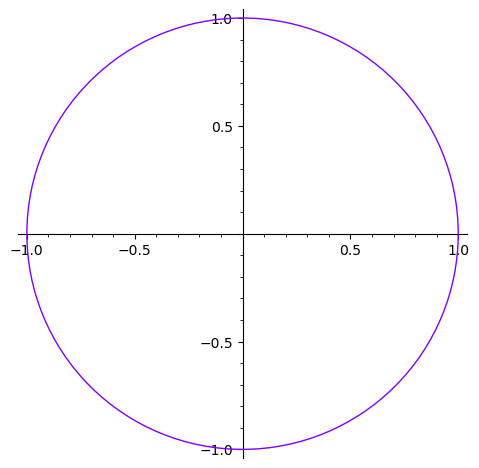

In [3]:
circle((0, 0), 1, rgbcolor=(0.5, 0, 1))

You can also produce a filled circle:

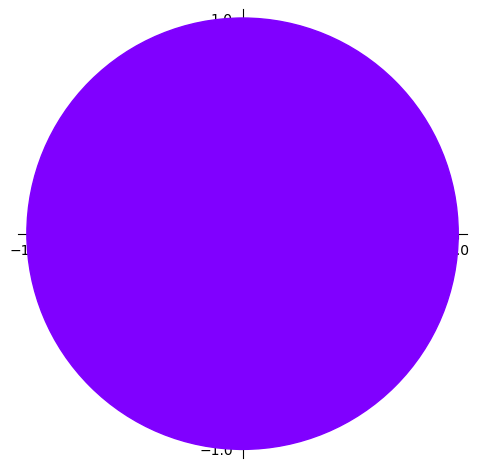

In [4]:
circle((0, 0), 1, rgbcolor=(0.5, 0, 1), fill=True)

You can also create a circle by assigning it to a variable; this does not plot it:

In [5]:
c = circle((0, 0), 1, rgbcolor=(0.5, 0, 1))

To plot it, use `c.show()` or `show(c)`, as follows:

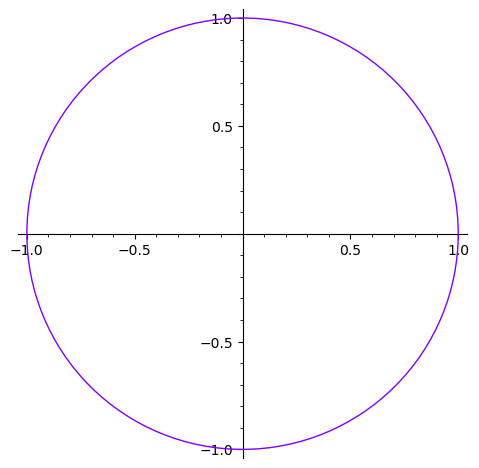

In [6]:
c.show()

Alternatively, evaluating `c.save('filename.png')` will save the plot to the given file.

Now, these ‘circles’ may look more like ellipses because the axes are scaled differently. You can fix this:

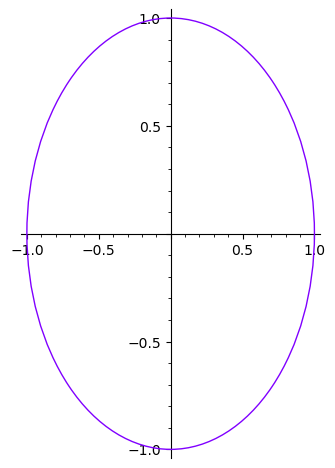

In [9]:
c.show(aspect_ratio=1.5)

The command `show(c, aspect_ratio=1)` accomplishes the same thing, or you can save the picture using `c.save('filename.png', aspect_ratio=1)`.

It’s easy to plot basic functions:

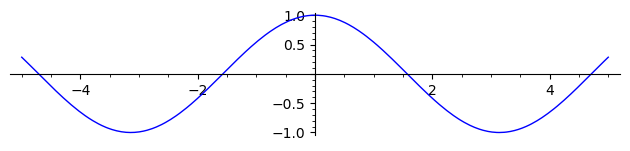

In [12]:
plot(cos, (-5, 5), aspect_ratio=1)

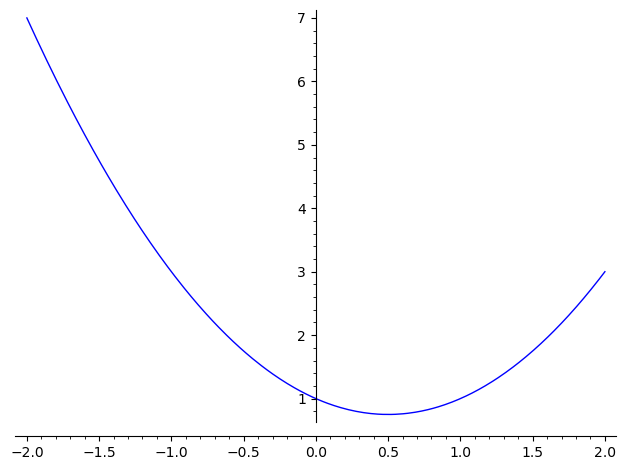

In [13]:
plot(x^2 - x + 1, (x, -2, 2))

Once you specify a variable name, you can also create parametric plots:

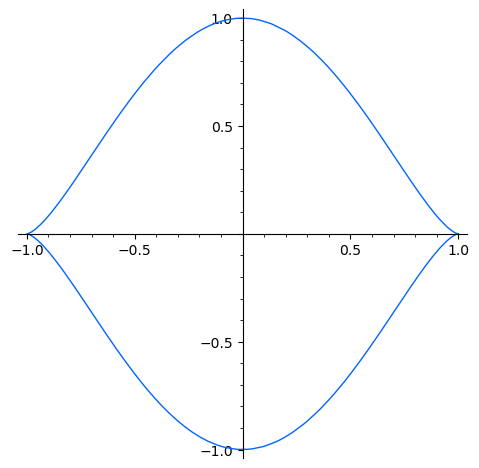

In [14]:
x = var('x')
parametric_plot((cos(x), sin(x)^3), (x, 0, 2*pi), rgbcolor=hue(0.6))

It’s important to notice that the axes of the plots will only intersect if the origin is in the viewing range of the graph, and that with sufficiently large values scientific notation may be used:

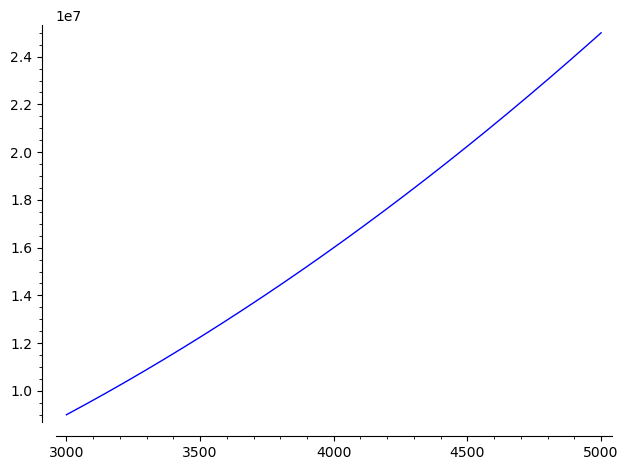

In [15]:
plot(x^2, (x, 3000, 5000))

You can combine several plots by summing them:

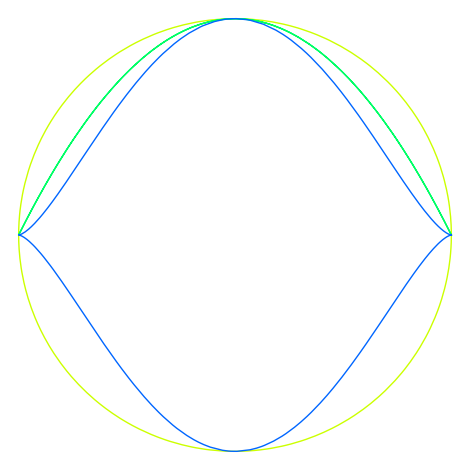

In [16]:
x = var('x')
p1 = parametric_plot((cos(x), sin(x)),   (x, 0, 2*pi), rgbcolor=hue(0.2))
p2 = parametric_plot((cos(x), sin(x)^2), (x, 0, 2*pi), rgbcolor=hue(0.4))
p3 = parametric_plot((cos(x), sin(x)^3), (x, 0, 2*pi), rgbcolor=hue(0.6))
show(p1 + p2 + p3, axes=false)

A good way to produce filled-in shapes is to produce a list of points (`L` in the example below) and then use the `polygon` command to plot the shape with boundary formed by those points. For example, here is a green deltoid:

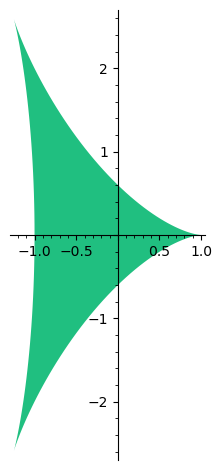

In [17]:
L = [[-1 + cos(pi*i/100) * (1 + cos(pi*i/100)),
       2 * sin(pi*i/100) * (1 - cos(pi*i/100))] for i in range(200)]
(p := polygon(L, rgbcolor=(1/8, 3/4, 1/2)))

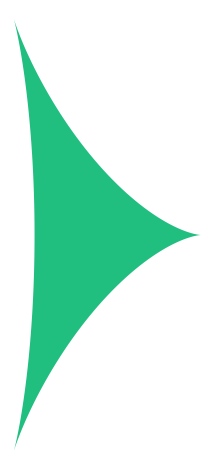

In [18]:
show(p, axes=false)

You can add text to a plot:

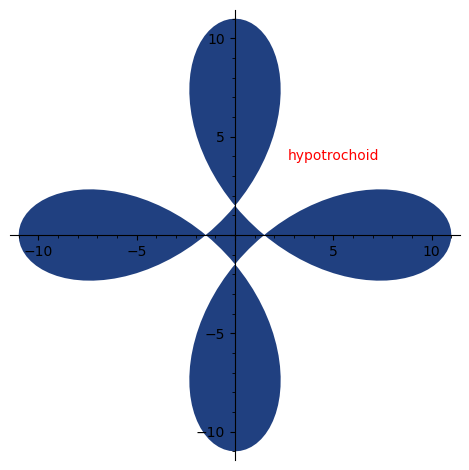

In [19]:
L = [[6 * cos(pi*i/100) + 5 * cos((6/2)*pi*i/100),
      6 * sin(pi*i/100) - 5 * sin((6/2)*pi*i/100)] for i in range(200)]
p = polygon(L, rgbcolor=(1/8, 1/4, 1/2))
t = text("hypotrochoid", (5, 4), rgbcolor=(1, 0, 0))
show(p + t)

Calculus teachers frequently draw the following plot on the board: not just one branch of arcsin but rather several of them: i.e., the plot of $y = \sin(x)$ for $x$ between $-2\pi$ and $2\pi$, flipped about the 45 degree line. The following Sage commands construct this:

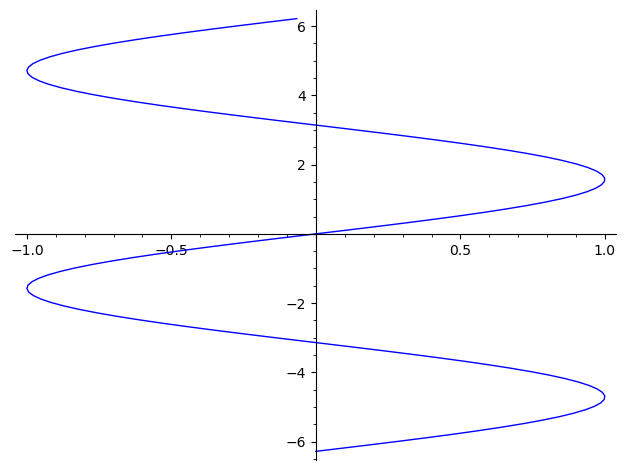

In [21]:
v = [(sin(x), x) for x in srange(-2*float(pi), 2*float(pi), 0.1)]
line(v)

In [20]:
srange?

Signature:      srange(*args, **kwds)
Type:           cython_function_or_method
String form:    <cyfunction srange at 0x7fb8769bcba0>
File:           /ext/sage/10.7/src/sage/arith/srange.pyx
Docstring:     
   Return a list of numbers "start, start+step, ..., start+k*step",
   where "start+k*step < end" and "start+(k+1)*step >= end".

   This provides one way to iterate over Sage integers as opposed to
   Python int's.  It also allows you to specify step sizes for such an
   iteration.

   INPUT:

   * "start" -- number (default: 0)

   * "end" -- number

   * "step" -- number (default: 1)

   * "universe -- parent or type where all the elements should live
     (default: deduce from inputs). This is only used if ``coerce" is
     true.

   * "coerce" -- convert "start", "end" and "step" to the same
     universe (either the universe given in "universe" or the
     automatically detected universe)

   * "include_endpoint" -- whether or not to include the endpoint
     (default: "False"

Since the tangent function has a larger range than sine, if you use the same trick to plot the inverse tangent, you should change the minimum and maximum coordinates for the x-axis:

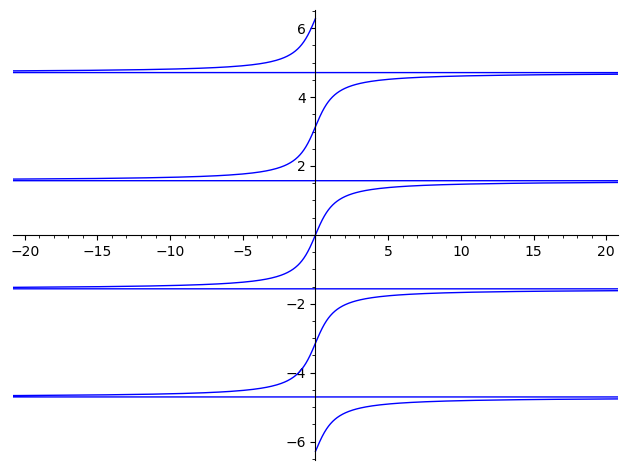

In [1]:
v = [(tan(x), x) for x in srange(-2*float(pi), 2*float(pi), 0.01)]
show(line(v), xmin=-20, xmax=20)

Sage also computes polar plots, contour plots and vector field plots (for special types of functions). Here is an example of a contour plot:

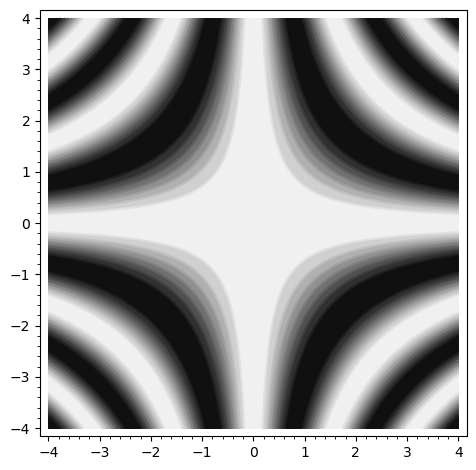

In [2]:
f = lambda x, y: cos(x*y)
contour_plot(f, (-4, 4), (-4, 4))

## Three-dimensional plots

Sage can also be used to create three-dimensional plots. In both the notebook and the REPL, these plots will be displayed by default using the open source package ThreeJS, which supports interactively rotating and zooming the figure with the mouse.

Use `plot3d` to graph a function of the form $f(x, y) = z$:

In [3]:
x, y = var('x, y')
plot3d(x^2 + y^2, (x, -2, 2), (y, -2, 2))

Graphics3d Object

Alternatively, you can use `parametric_plot3d` to graph a parametric surface where each of $x, y, z$ is determined by a function of one or two variables (the parameters, typically $u$ and $v$). The previous plot can be expressed parametrically as follows:

In [5]:
u, v = var('u, v')
f_x(u, v) = u - vb
f_y(u, v) = v
f_z(u, v) = u^2 + v^2
parametric_plot3d([f_x, f_y, f_z], (u, -2, 2), (v, -2, 2))

Graphics3d Object

In [7]:
g_x(u) = u
g_y(u) = u^2
g_z(u) = u^3
parametric_plot3d([g_x, g_y, g_z], (u, -3, 3))

Graphics3d Object

The third way to plot a 3D surface in Sage is `implicit_plot3d, which graphs a contour of a function like $f(x, y, z) = 0$ (this defines a set of points). We graph a sphere using the classical formula:

In [8]:
x, y, z = var('x, y, z')
implicit_plot3d(x^2 + y^2 + z^2 - 4, (x, -2, 2), (y, -2, 2), (z, -2, 2))

Graphics3d Object

Here are some more examples:

Yellow [Whitney’s umbrella](http://en.wikipedia.org/wiki/Whitney_umbrella):

In [9]:
u, v = var('u,v')
fx = u * v
fy = u
fz = v^2
parametric_plot3d([fx, fy, fz], (u, -1, 1), (v, -1, 1), frame=False, color="yellow")

Graphics3d Object

[Cross cap](http://en.wikipedia.org/wiki/Cross-cap):

In [10]:
u, v = var('u, v')
fx = (1 + cos(v)) * cos(u)
fy = (1 + cos(v)) * sin(u)
fz = -tanh((2/3) * (u - pi)) * sin(v)
parametric_plot3d([fx, fy, fz], (u, 0, 2*pi), (v, 0, 2*pi), frame=False, color="red")

Graphics3d Object

Twisted torus:

In [11]:
u, v = var('u, v')
fx = (3 + sin(v) + cos(u)) * cos(2*v)
fy = (3 + sin(v) + cos(u)) * sin(2*v)
fz = sin(u) + 2 * cos(v)
parametric_plot3d([fx, fy, fz], (u, 0, 2*pi), (v, 0, 2*pi), frame=False, color="red")

Graphics3d Object

Lemniscate:

In [12]:
x, y, z = var('x, y, z')
f(x, y, z) = 4*x^2 * (x^2 + y^2 + z^2 + z) + y^2 * (y^2 + z^2 - 1)
implicit_plot3d(f, (x, -0.5, 0.5), (y, -1, 1), (z, -1, 1))

Graphics3d Object

## [Interactive plots](https://wiki.sagemath.org/interact/)

Interactive plots can be drawn by using the `interact` decorator on a function.

Let us draw a plot demonstrating the Taylor series of a function.

In [14]:
x   = var('x')
x0  = 0
f   = sin(x) * e^(-x)
p   = plot(f, -1, 5, thickness=2)
dot = point((x0, f(x=x0)), pointsize=80, rgbcolor=(1, 0, 0))

@interact
def _(order=slider([1 .. 12])):
  ft = f.taylor(x, x0, order)
  pt = plot(ft, -1, 5, color='green', thickness=2)
  pretty_print(html(r'$f(x)\;=\;%s$' % latex(f)))
  pretty_print(html(r'$\hat{f}(x;%s)\;=\;%s+\mathcal{O}(x^{%s})$' % (x0, latex(ft), order+1)))
  show(dot + p + pt, ymin=-.5, ymax=1)

Interactive function <function _ at 0x7ff71bc2eac0> with 1 widget
  order: SelectionSlider(description='order', options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12), value=1)